In [1]:
# Pretty display for notebooks
%matplotlib inline

# Ignore the warnings
import warnings
warnings.filterwarnings('ignore')

# Load the dataset
weather = pd.read_csv("../asset/weather.csv")

import awesome_functions as cf

# 원본을 유지하기 위해서 카피
df_weather = weather.copy()

In [80]:
df_weather = weather.copy()

In [79]:
def changeMToNan(data):
    data = str(data).strip()
    if data == "M":
        return np.nan
    else:
        return int(data)

In [39]:
df_weather_final = pd.read_csv("weather_2.0_final_201807051335.csv")

In [82]:
df_weather["tmax"] = df_weather["tmax"].apply(changeMToNan)

In [91]:
df_weather = df_weather[df_weather["station_nbr"] != 5]

In [103]:
tmax_nan = df_weather[np.isnan(df_weather["tmax"])]

In [127]:
station_divide_line = []
for station in df_weather["station_nbr"].unique():
    station_divide_line.append((station, df_weather[df_weather["station_nbr"] == station].tail(1).index[0]))

In [184]:
tmax_nan_station_x_loc = []
for station in tmax_nan["station_nbr"].unique():
    tmax_nan_station_x_loc.append((station, list(tmax_nan[tmax_nan["station_nbr"] == station].index)))
tmax_nan_station_x_loc.insert(8, (10, []))

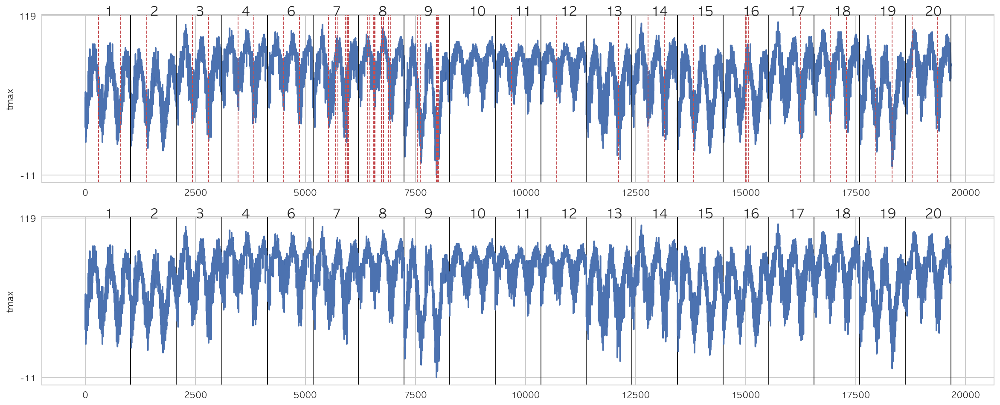

In [149]:
plt.figure(figsize=(20, 8))
plt.subplot(2, 1, 1)
plt.yticks([int(df_weather["tmax"].min()), int(df_weather["tmax"].max()) + 5])
plt.ylabel("tmax")
plt.plot(df_weather.index, df_weather["tmax"])
for x_ in tmax_nan.index:
    plt.axvline(x=x_, color='r', linestyle='--', lw =1)    
for x_ in station_divide_line:
    plt.axvline(x=x_[1], color='k', linestyle='-', lw =1)    
    plt.annotate(x_[0], xy=(x_[1] - 600, int(df_weather["tmax"].max()) + 5), fontsize = 15)

plt.subplot(2, 1, 2)
plt.yticks([int(df_weather_final["tmax"].min()), int(df_weather_final["tmax"].max()) + 5])
plt.ylabel("tmax")
for x_ in station_divide_line:
    plt.axvline(x=x_[1], color='k', linestyle='-', lw =1)    
    plt.annotate(x_[0], xy=(x_[1] - 600, int(df_weather["tmax"].max()) + 5), fontsize = 15)
plt.plot(df_weather_final.index, df_weather_final["tmax"])

plt.show()

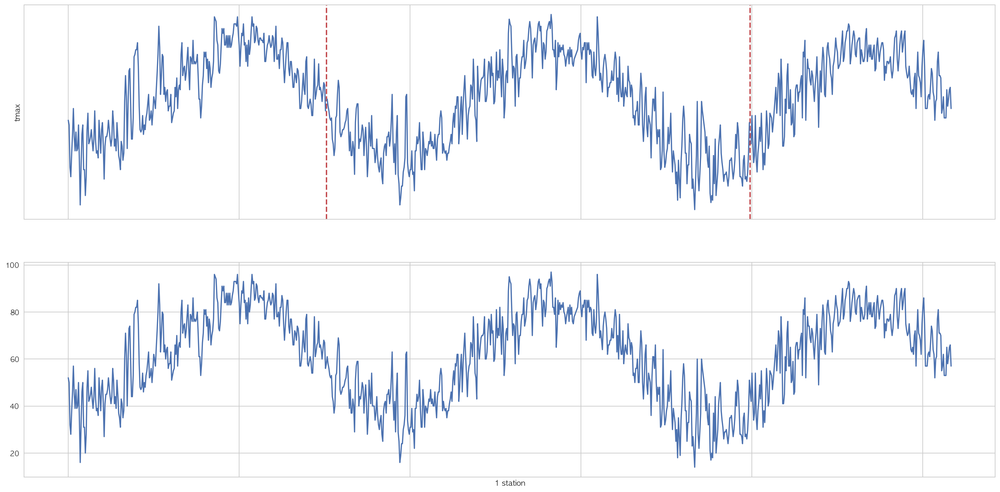

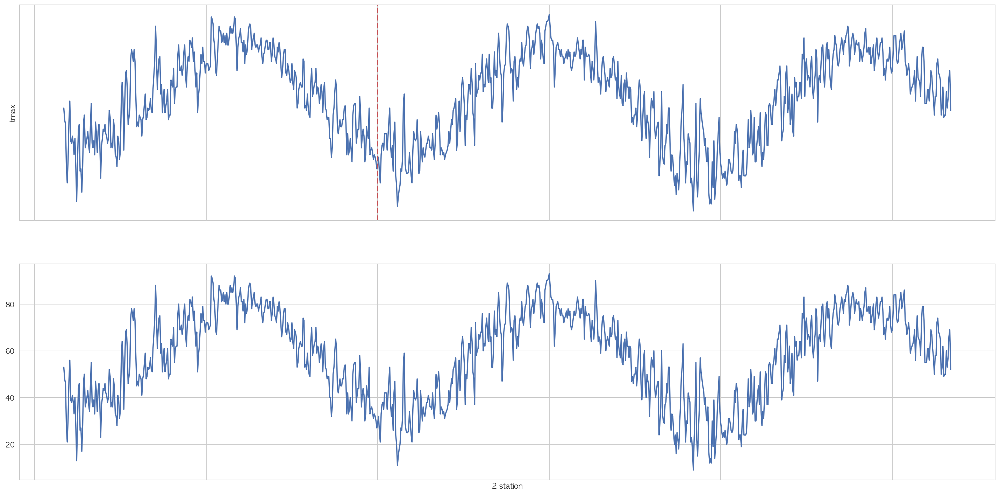

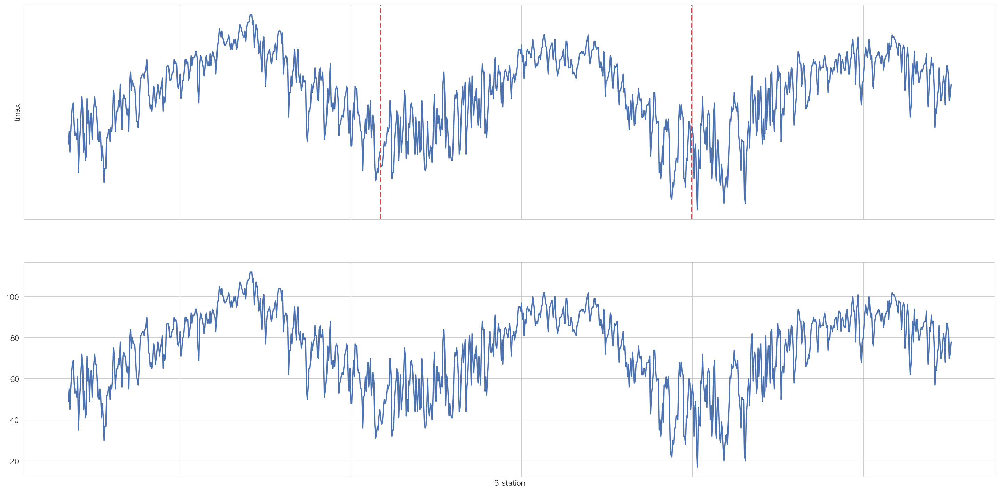

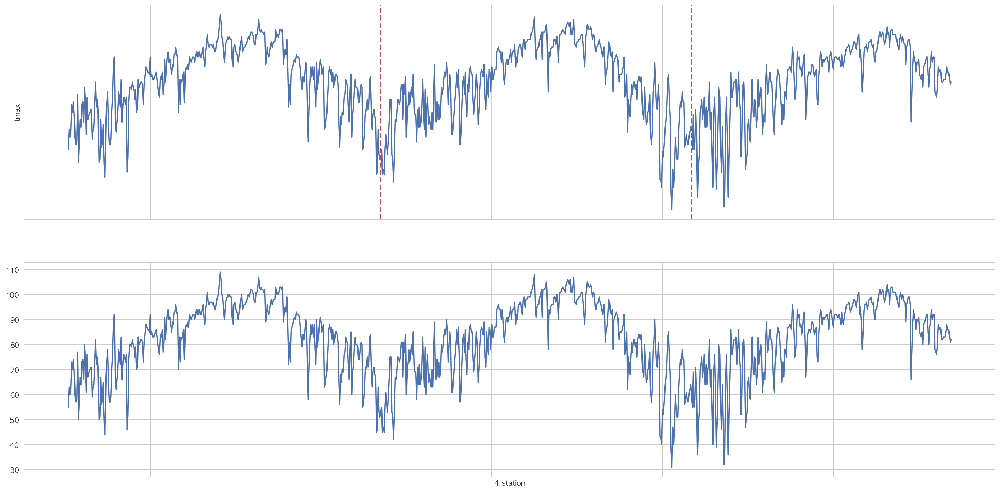

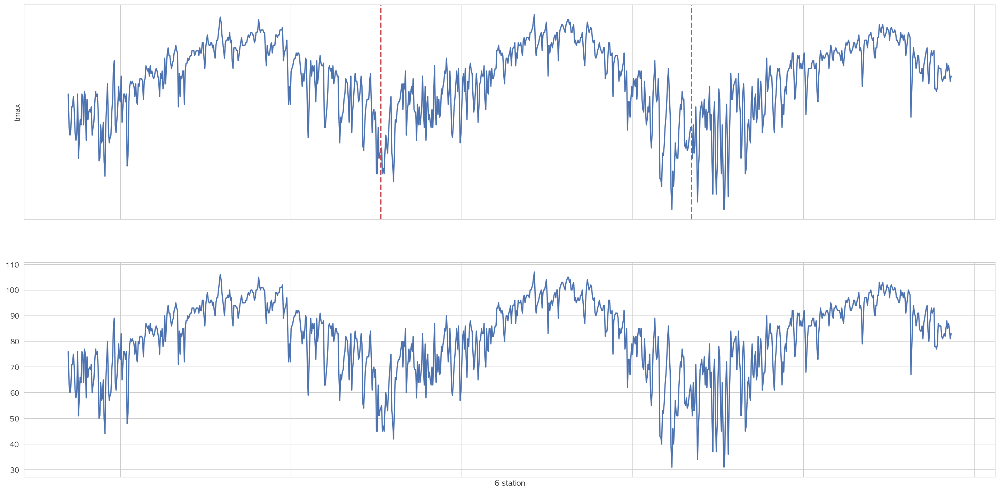

...

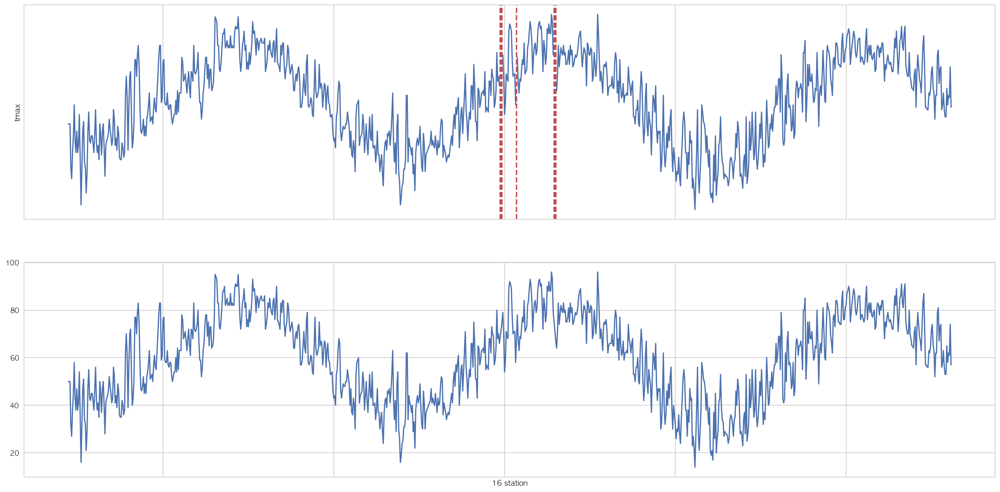

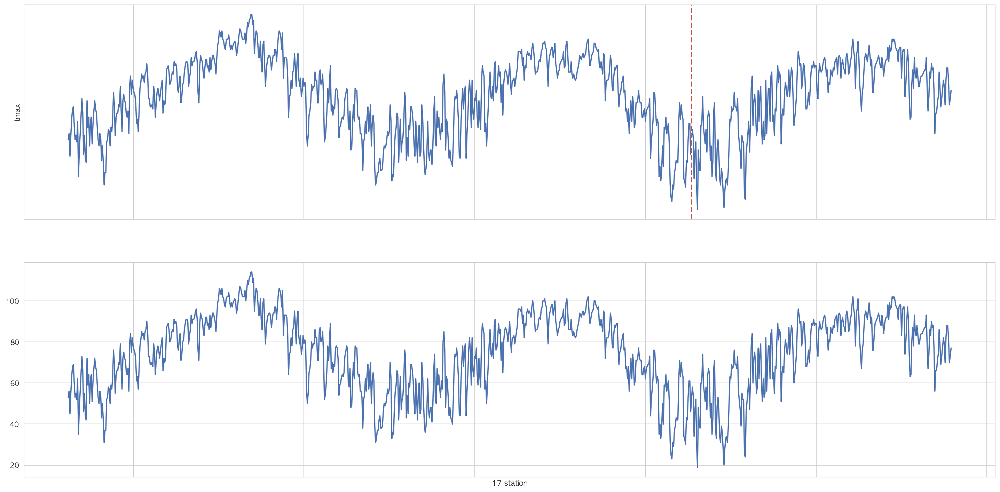

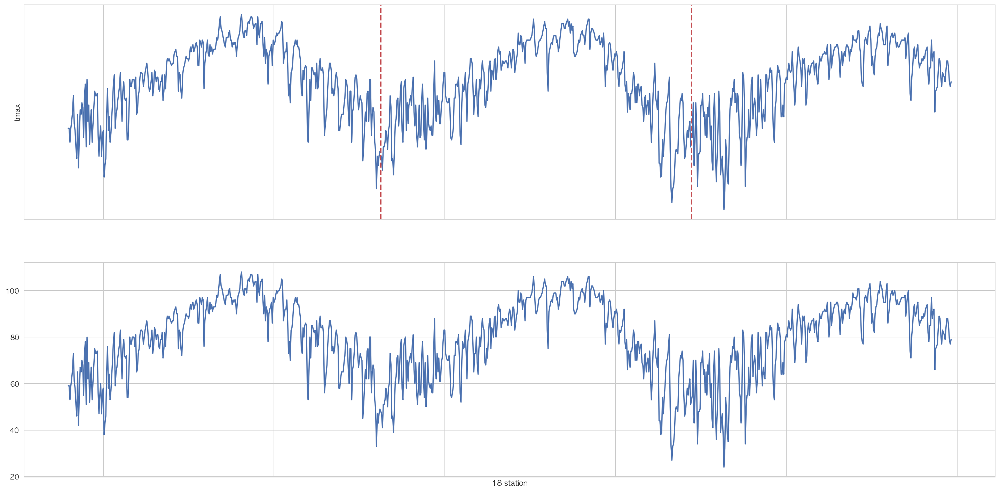

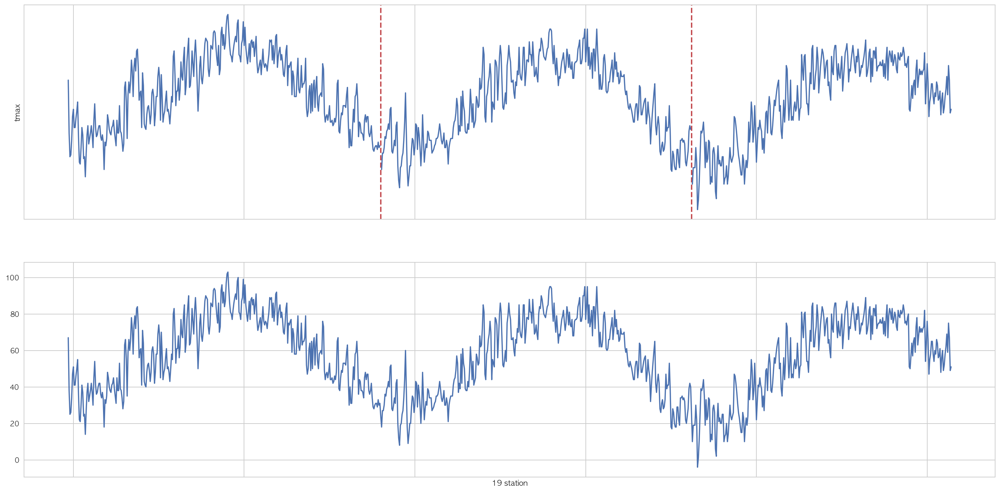

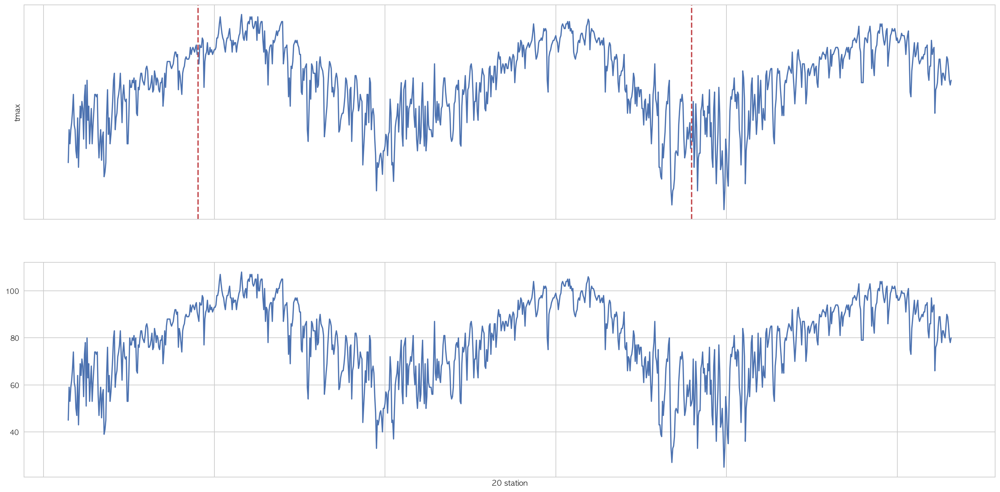

In [189]:
tmp = 0
for i, x_ in enumerate(station_divide_line):
    plt.figure(figsize=(25, 12.5))
    plt.subplot(len(station_divide_line), 1, i + 1)
    plt.subplot(2, 1, 1)
    plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
    plt.yticks([int(df_weather["tmax"].min()), int(df_weather["tmax"].max()) + 5])
    for x_loc in tmax_nan_station_x_loc[i][1]:
        if x_loc !="":
            plt.axvline(x=x_loc, color='r', linestyle='--', lw = 2)    
    plt.ylabel("tmax")
    plt.plot(df_weather.index[tmp:x_[1]], df_weather["tmax"][tmp:x_[1]])
    plt.subplot(2, 1, 2)
    plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
    plt.plot(df_weather_final.index[tmp:x_[1]], df_weather_final["tmax"][tmp:x_[1]])
    plt.xlabel(str(x_[0]) + " station")
    tmp = x_[1]
plt.show()

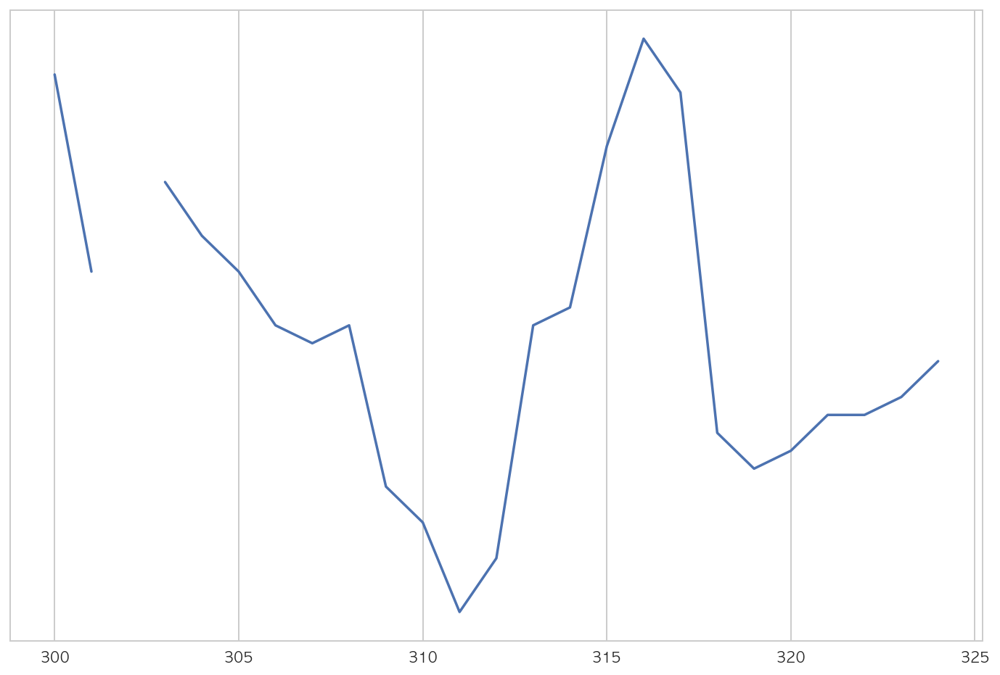

In [42]:
plt.figure(figsize=(12, 8))
plt.yticks([-10, int(station_1["tmax"].max())])
plt.plot(station_1[300:325]["tmax"])
plt.show()

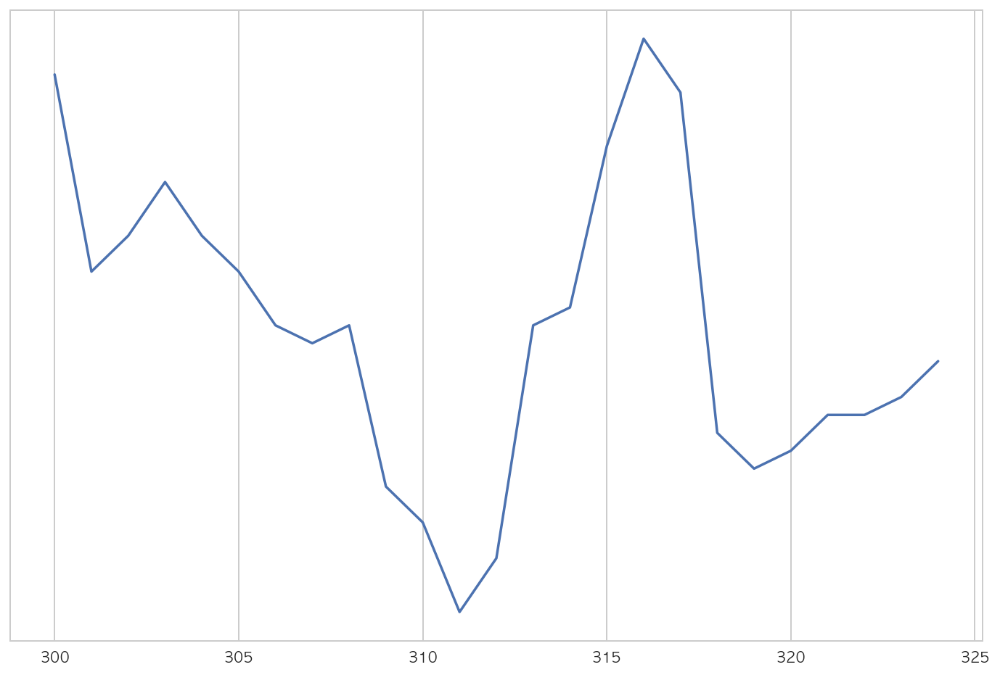

In [43]:
plt.figure(figsize=(12, 8))
plt.yticks([-10, int(station_1_final["tmax"].max())])
plt.plot(station_1_final[300:325]["tmax"])
plt.show()